## Setup & Instalasi


In [1]:
!pip install diffusers transformers accelerate pillow matplotlib opencv-python
!pip install streamlit==1.40.0 streamlit-drawable-canvas==0.9.3

import torch
print("CUDA:", torch.cuda.is_available(), "| Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "cpu")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 80.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 kB 6.8 MB/s eta 0:00:00
  Attempting uninstall: watchdog
    Found existing installation: watchdog 6.0.0
    Uninstalling watchdog-6.0.0:
      Successfully uninstalled watchdog-6.0.0
  Attempting uninstall: packaging
    Found existing installation: packaging 26.2
    Uninstalling packaging-26.2:
      Successfully uninstalled packaging-26.2
  Attempting uninstall: cachetools
    Found existing installation: cachetools 6.2.6
    Uninstalling cachetools-6.2.6:
      Successfully uninstalled cachetools-6.2.6
ERROR: pip's dependency resolver does not 

KeyboardInterrupt: 

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline, StableDiffusionInpaintPipeline, StableDiffusionImg2ImgPipeline
from diffusers import DPMSolverMultistepScheduler, DDIMScheduler, EulerAncestralDiscreteScheduler
from diffusers import LMSDiscreteScheduler, PNDMScheduler
from PIL import Image, ImageDraw
import gc
import warnings
warnings.filterwarnings('ignore')

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_ID = "runwayml/stable-diffusion-v1-5"
INPAINT_MODEL_ID = "runwayml/stable-diffusion-inpainting"

def load_base_pipe():
    pipe = StableDiffusionPipeline.from_pretrained(MODEL_ID, torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32)
    pipe = pipe.to(DEVICE)
    if DEVICE == "cuda":
        pipe.enable_attention_slicing()
    return pipe

def load_inpaint_pipe():
    pipe = StableDiffusionInpaintPipeline.from_pretrained(INPAINT_MODEL_ID, torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32)
    pipe = pipe.to(DEVICE)
    if DEVICE == "cuda":
        pipe.enable_attention_slicing()
    return pipe

def generate_simple_image(prompt, negative_prompt="", seed=42):
    pipe = load_base_pipe()
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    # Basic params (low steps/guidance) → cenderung gaya 2D/lukisan
    image = pipe(prompt=prompt, negative_prompt=negative_prompt, generator=generator).images[0]
    return image

def generate_advanced_image(prompt, negative_prompt="", seed=42, guidance_scale=7.5, num_inference_steps=50):
    pipe = load_base_pipe()
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    image = pipe(prompt=prompt, negative_prompt=negative_prompt, generator=generator, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images[0]
    return image

def load_scheduler(pipe, scheduler_name):
    s = scheduler_name.lower()
    if s in ("euler a", "euler"):
        scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
    elif s in ("dpm++", "dpm++ 2m karras"):
        scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
    elif s == "ddim":
        scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
    elif s == "lms":
        scheduler = LMSDiscreteScheduler.from_config(pipe.scheduler.config)
    elif s == "pndm":
        scheduler = PNDMScheduler.from_config(pipe.scheduler.config)
    else:
        raise ValueError(f"Scheduler '{scheduler_name}' not recognized. Choose from: Euler A, DPM++, DDIM, LMS, PNDM")
    pipe.scheduler = scheduler
    return pipe

def generate_batch(prompt, negative_prompt="", seed=42, guidance_scale=7.5, num_inference_steps=50, n_images=4, scheduler_name=None):
    pipe = load_base_pipe()
    if scheduler_name:
        pipe = load_scheduler(pipe, scheduler_name)
    images = []
    for i in range(n_images):
        generator = torch.Generator(device=DEVICE).manual_seed(seed + i)
        image = pipe(prompt=prompt, negative_prompt=negative_prompt, generator=generator, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images[0]
        images.append(image)
    return images

def display_grid(images, rows=2, cols=2, figsize=(10, 10), titles=None):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        if i < len(images):
            ax.imshow(images[i])
            ax.axis('off')
            if titles and i < len(titles):
                ax.set_title(titles[i], fontsize=10)
        else:
            ax.axis('off')
    plt.tight_layout()
    plt.show()

def display_image(image, title=None, figsize=(6, 6)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def inpaint_engine(image, mask, prompt, negative_prompt="", seed=9, guidance_scale=7.5, num_inference_steps=50):
    pipe = load_inpaint_pipe()
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    result = pipe(prompt=prompt, negative_prompt=negative_prompt, image=image, mask_image=mask, generator=generator, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images[0]
    return result

def create_manual_mask(image, mask_region):
    mask = Image.new("L", image.size, 0)
    draw = ImageDraw.Draw(mask)
    if isinstance(mask_region, tuple):
        if len(mask_region) == 4:
            draw.rectangle(mask_region, fill=255)
        elif len(mask_region) == 2:
            cx, cy = mask_region
            draw.ellipse([cx - 40, cy - 40, cx + 40, cy + 40], fill=255)
    elif isinstance(mask_region, list):
        for region in mask_region:
            if len(region) == 4:
                draw.rectangle(region, fill=255)
            elif len(region) == 2:
                cx, cy = region
                draw.ellipse([cx - 40, cy - 40, cx + 40, cy + 40], fill=255)
    return mask

def auto_mask_with_segmentation(image):
    try:
        from transformers import pipeline as hf_pipeline
        segmenter = hf_pipeline("image-segmentation", model="nvidia/segformer-b0-finetuned-ade-512-512")
        results = segmenter(image)
        mask_arr = np.zeros((image.size[1], image.size[0]), dtype=np.uint8)
        for r in results:
            if r.get("mask"):
                m = np.array(r["mask"])
                mask_arr = np.maximum(mask_arr, (m > 0.5).astype(np.uint8) * 255)
        return Image.fromarray(mask_arr)
    except ImportError:
        print("transformers not available for segmentation, falling back to manual masking")
        return None

def prepare_outpainting(image, direction="right", expand_pixels=128, fill_color=(0, 0, 0)):
    w, h = image.size
    if direction == "right":
        new_img = Image.new("RGB", (w + expand_pixels, h), fill_color)
        new_img.paste(image, (0, 0))
        mask = Image.new("L", (w + expand_pixels, h), 0)
        ImageDraw.Draw(mask).rectangle([w, 0, w + expand_pixels, h], fill=255)
    elif direction == "left":
        new_img = Image.new("RGB", (w + expand_pixels, h), fill_color)
        new_img.paste(image, (expand_pixels, 0))
        mask = Image.new("L", (w + expand_pixels, h), 0)
        ImageDraw.Draw(mask).rectangle([0, 0, expand_pixels, h], fill=255)
    elif direction == "up":
        new_img = Image.new("RGB", (w, h + expand_pixels), fill_color)
        new_img.paste(image, (0, expand_pixels))
        mask = Image.new("L", (w, h + expand_pixels), 0)
        ImageDraw.Draw(mask).rectangle([0, 0, w, expand_pixels], fill=255)
    elif direction == "down":
        new_img = Image.new("RGB", (w, h + expand_pixels), fill_color)
        new_img.paste(image, (0, 0))
        mask = Image.new("L", (w, h + expand_pixels), 0)
        ImageDraw.Draw(mask).rectangle([0, h, w, h + expand_pixels], fill=255)
    else:
        raise ValueError("direction must be one of: left, right, up, down")
    return new_img, mask

def do_outpainting(image, prompt, direction="right", expand_pixels=128, seed=9, guidance_scale=7.5, num_inference_steps=50):
    expanded_img, mask = prepare_outpainting(image, direction, expand_pixels)
    return inpaint_engine(expanded_img, mask, prompt, seed=seed, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps)

def zoom_out(image, prompt, expand_pixels=128, steps=2, seed=9, guidance_scale=7.5, num_inference_steps=50):
    current = image
    for i in range(steps):
        for direction in ["right", "down", "left", "up"]:
            current = do_outpainting(current, prompt, direction=direction, expand_pixels=expand_pixels, seed=seed + i, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps)
    return current

def two_stage_generate(prompt, negative_prompt="", seed=42, guidance_scale=7.5, num_inference_steps=50):
    pipe_base = load_base_pipe()
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    init_image = pipe_base(prompt=prompt, negative_prompt=negative_prompt, generator=generator, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps, denoising_end=0.8).images[0]
    pipe_refiner = StableDiffusionImg2ImgPipeline.from_pretrained(MODEL_ID, torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32).to(DEVICE)
    if DEVICE == "cuda":
        pipe_refiner.enable_attention_slicing()
    return pipe_refiner(prompt=prompt, negative_prompt=negative_prompt, image=init_image, generator=generator, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps, strength=0.2).images[0]

def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    print("Memory cleared.")

print(f"Using device: {DEVICE}")


Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Using device: cuda


---
# Kriteria 1: Text-to-Image Generation (Basic)


### ⚡ Tips Kriteria 1
- **Prompt SAMA** untuk simple & advanced (jangan ubah antara keduanya)
- Run **cell di bawah ini sekali** — generate simple DAN advanced bersamaan
- Simple harus terlihat **2D/lukisan** | Advanced harus **fotorealistik + Earth di langit**
- Jika masih mirip: ganti `seed` ke `42` atau `123`, run ulang cell generate saja


Generating SIMPLE...


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

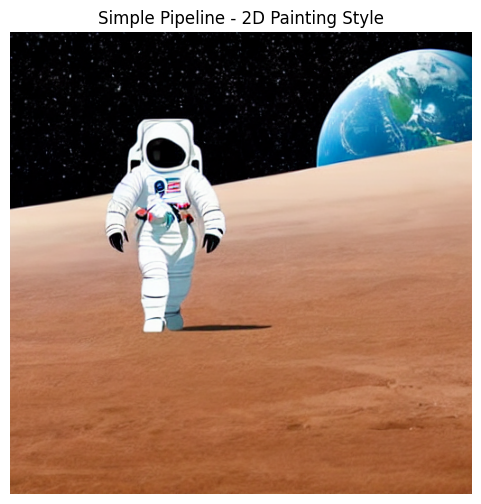

Generating ADVANCED...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

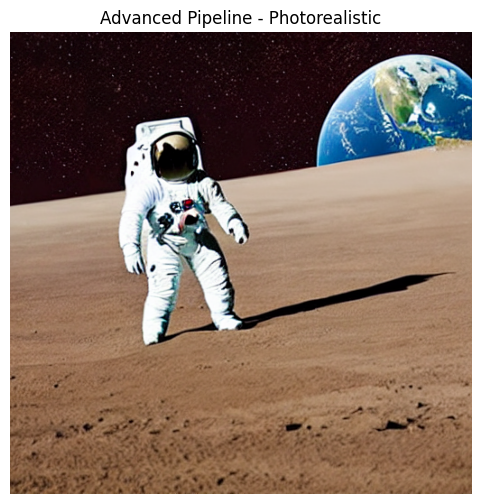

In [2]:
prompt = "an astronaut with full white spacesuit, standing on a flat moon plain, with earth in the background, minimal detail, 2D digital illustration"

seed = 222

negative_prompt = "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"

print("Generating SIMPLE...")
image_simple = generate_simple_image(prompt=prompt, negative_prompt=negative_prompt, seed=seed)
display_image(image_simple, title="Simple Pipeline - 2D Painting Style")

print("Generating ADVANCED...")
image_advanced = generate_advanced_image(
    prompt=prompt,
    negative_prompt=negative_prompt,
    seed=seed,
    guidance_scale=10,
    num_inference_steps=150,
)
display_image(image_advanced, title="Advanced Pipeline - Photorealistic")

### Perbandingan Hasil


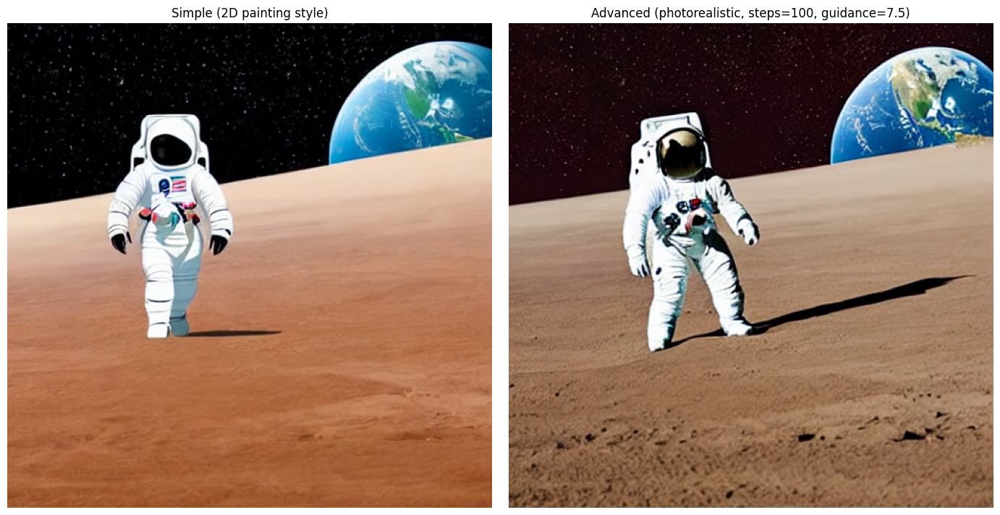

In [3]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].imshow(image_simple); axes[0].set_title("Simple (2D painting style)", fontsize=12); axes[0].axis('off')
axes[1].imshow(image_advanced); axes[1].set_title("Advanced (photorealistic, steps=100, guidance=7.5)", fontsize=12); axes[1].axis('off')
plt.tight_layout(); plt.show()


---
# Kriteria 1: Skilled - Eksperimen


### Eksperimen 1: Guidance Scale (CFG Scale)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Generated with guidance_scale=2.0


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Generated with guidance_scale=7.5


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Generated with guidance_scale=15.0


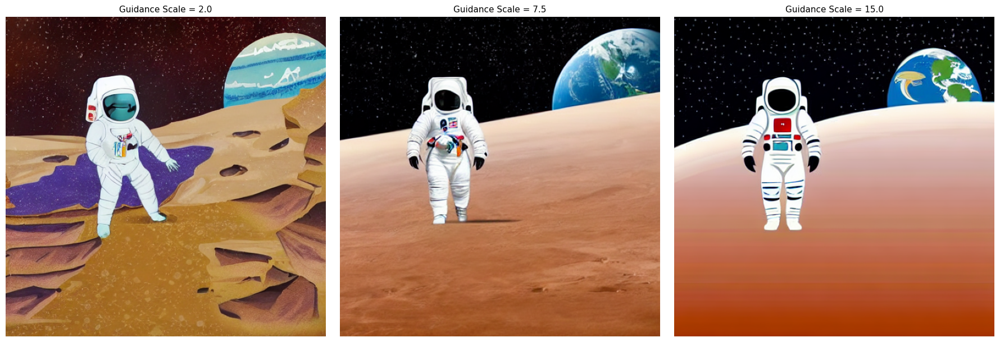

In [4]:
guidance_scales = [2.0, 7.5, 15.0]
gs_images = []
for gs in guidance_scales:
    img = generate_advanced_image(prompt=prompt, negative_prompt=negative_prompt, seed=222, guidance_scale=gs, num_inference_steps=100)
    gs_images.append(img)
    print(f"Generated with guidance_scale={gs}")

titles = [f"Guidance Scale = {gs}" for gs in guidance_scales]
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, (img, t) in enumerate(zip(gs_images, titles)):
    axes[i].imshow(img); axes[i].set_title(t, fontsize=11); axes[i].axis('off')
plt.tight_layout(); plt.show()


#### Analisis Guidance Scale:
**Gambar dengan Scale Rendah (2.0):**
Gambar dengan guidance scale rendah (2.0) memiliki kualitas yang lebih lembut dengan detail yang tidak terlalu tajam. Interpretasi model lebih bebas sehingga terkadang menghasilkan komposisi yang tidak sepenuhnya sesuai dengan prompt.

**Gambar dengan Scale Tinggi (15.0):**
Dengan guidance scale 15.0, gambar yang dihasilkan sangat sesuai dengan prompt. Detail lebih tajam dan eksplisit, namun saturasi warna cenderung lebih kuat dan komposisi bisa terasa kurang alami.


### Eksperimen 2: Jumlah Inference Steps


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Generated with num_inference_steps=10


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Generated with num_inference_steps=25


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated with num_inference_steps=50


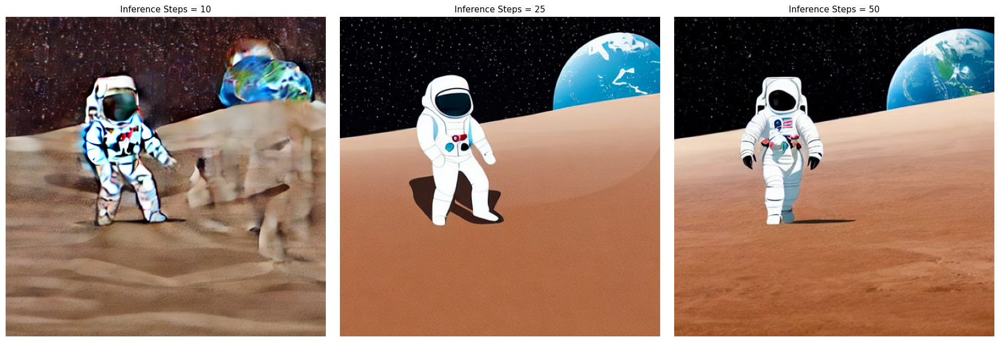

In [6]:
step_values = [10, 25, 50]
steps_images = []
for steps in step_values:
    img = generate_advanced_image(prompt=prompt, negative_prompt=negative_prompt, seed=222, guidance_scale=7.5, num_inference_steps=steps)
    steps_images.append(img)
    print(f"Generated with num_inference_steps={steps}")

titles = [f"Inference Steps = {s}" for s in step_values]
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, (img, t) in enumerate(zip(steps_images, titles)):
    axes[i].imshow(img); axes[i].set_title(t, fontsize=11); axes[i].axis('off')
plt.tight_layout(); plt.show()


#### Analisis Jumlah Inference Steps:
**Gambar dengan Step Rendah (10):**
Dengan 10 inference steps, gambar yang dihasilkan tampak kurang detail dengan tekstur yang kasar. Noise dan artefak masih cukup terlihat karena proses denoising belum berjalan optimal.

**Gambar dengan Step Tinggi (50):**
Pada 50 inference steps, gambar yang dihasilkan jauh lebih halus dan detail. Noise hampir tidak tampak dan artefak berkurang signifikan. Stabilitas visual jauh lebih baik dibandingkan step rendah.


---
# Kriteria 1: Advanced - Batch Inference & Scheduler Comparison


### Batch Inference - Grid 2x2


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

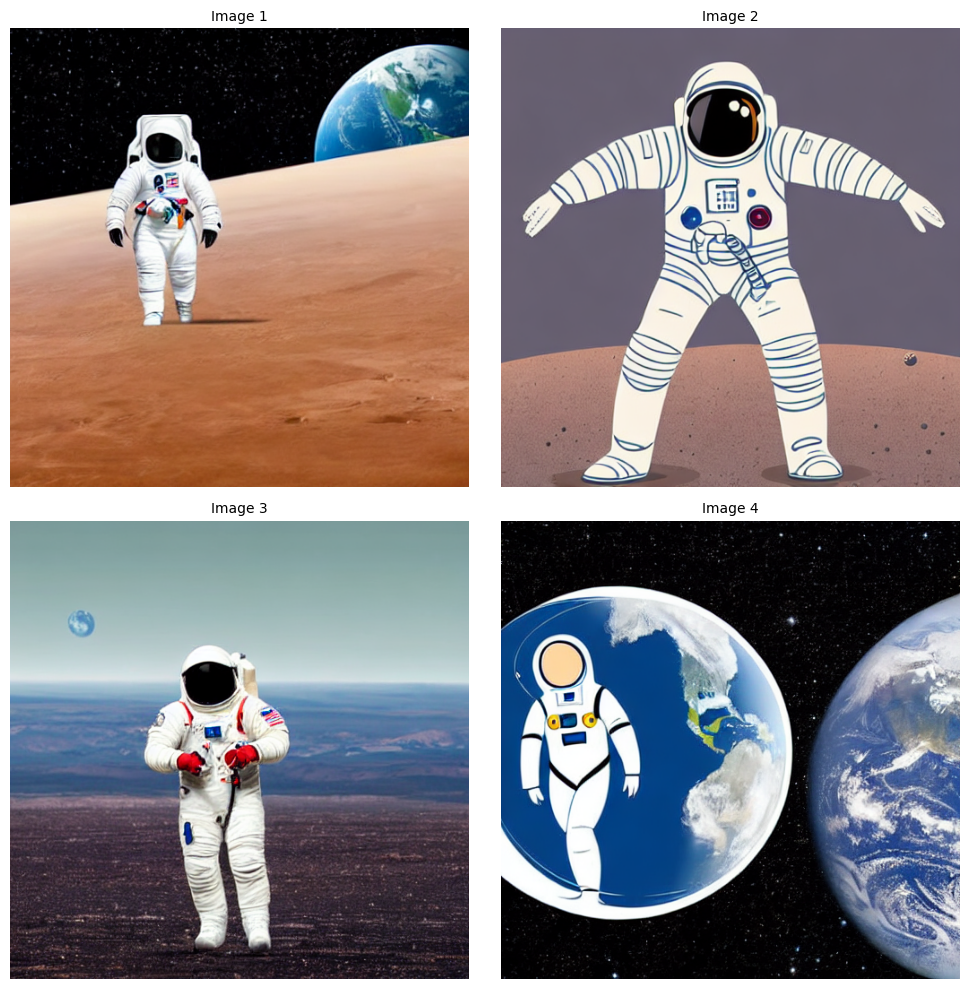

In [7]:
batch_images = generate_batch(prompt=prompt, negative_prompt=negative_prompt, seed=222, guidance_scale=7.5, num_inference_steps=100, n_images=4)
display_grid(batch_images, rows=2, cols=2, figsize=(10, 10), titles=["Image 1", "Image 2", "Image 3", "Image 4"])


### Perbandingan 3 Scheduler Berbeda


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Generated with Euler A scheduler


  0%|          | 0/100 [00:00<?, ?it/s]

Generated with DPM++ scheduler


  0%|          | 0/100 [00:00<?, ?it/s]

Generated with DDIM scheduler


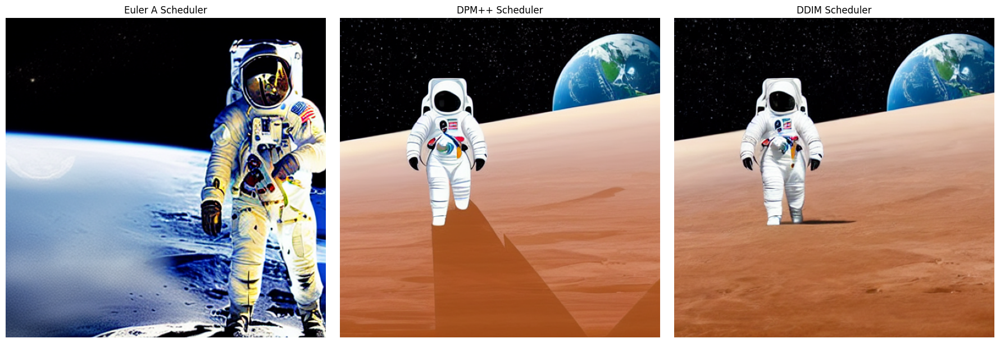

Memory cleared.


In [8]:
scheduler_names = ["Euler A", "DPM++", "DDIM"]
scheduler_images = []
pipe = load_base_pipe()
for sched_name in scheduler_names:
    pipe = load_scheduler(pipe, sched_name)
    gen = torch.Generator(device=DEVICE).manual_seed(222)
    img = pipe(prompt=prompt, negative_prompt=negative_prompt, generator=gen, guidance_scale=7.5, num_inference_steps=100).images[0]
    scheduler_images.append(img)
    print(f"Generated with {sched_name} scheduler")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, (img, name) in enumerate(zip(scheduler_images, scheduler_names)):
    axes[i].imshow(img); axes[i].set_title(f"{name} Scheduler", fontsize=12); axes[i].axis('off')
plt.tight_layout(); plt.show()
del pipe; clear_memory()


#### Analisis Perbandingan Scheduler:
**Gambar dengan Euler A Scheduler:**
Euler A menghasilkan gambar dengan variasi yang lebih kreatif dan detail yang kaya. Proses sampling yang lebih eksploratif membuat tekstur terasa lebih organik.

**Gambar dengan DPM++ Scheduler:**
DPM++ menghasilkan gambar dengan kualitas terbaik dalam hal ketajaman dan detail. Konvergensi yang lebih cepat memberikan hasil yang bersih dengan noise minimal.

**Gambar dengan DDIM Scheduler:**
DDIM menghasilkan gambar yang lebih konservatif dengan detail yang lebih halus namun kurang ekspresif. Keunggulan DDIM adalah deterministiknya yang memungkinkan reprodusibilitas sempurna.


---
# Kriteria 2: Image-to-Image (Inpainting) - Basic


### Fungsi `inpaint_engine()` dengan Manual Masking


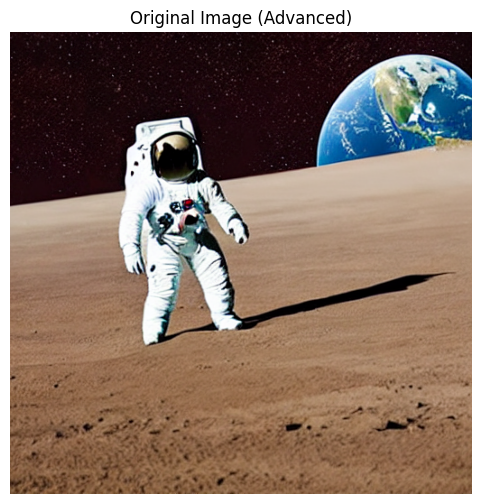

In [9]:
# Gunakan gambar advanced (fotorealistik) dari Kriteria 1 sebagai input inpainting
base_image = image_advanced.copy()
base_image.save("input_image.jpg")
display_image(base_image, title="Original Image (Advanced)")


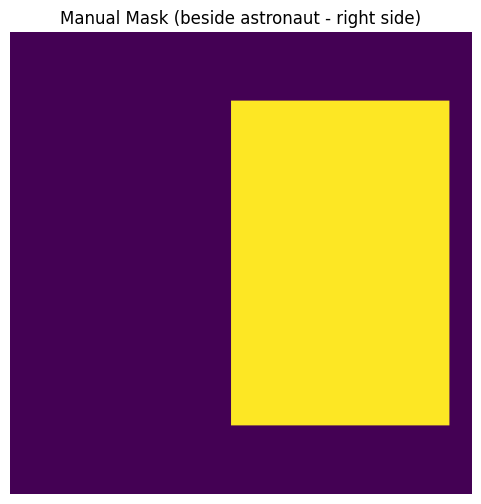

In [10]:
w, h = base_image.size
# Mask besar di samping kanan astronot (sesuai contoh rubrik)
mask_x1, mask_y1 = int(w * 0.48), int(h * 0.15)
mask_x2, mask_y2 = int(w * 0.95), int(h * 0.85)
mask = create_manual_mask(base_image, (mask_x1, mask_y1, mask_x2, mask_y2))
display_image(mask, title="Manual Mask (beside astronaut - right side)")


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

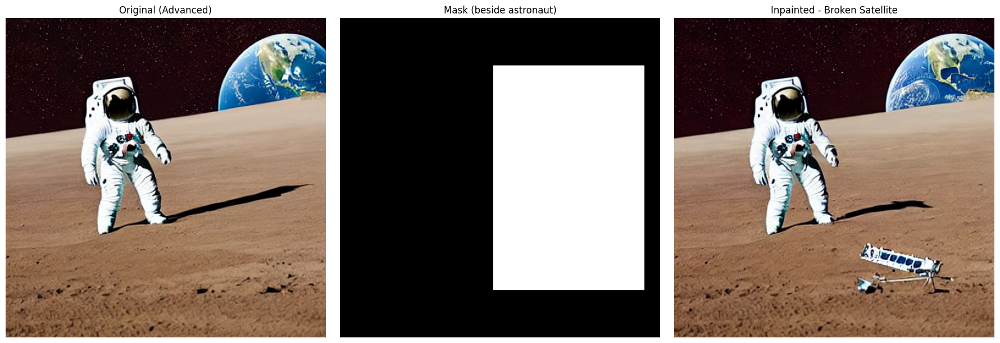

In [12]:
inpaint_prompt = "a large severely damaged and broken satellite wreckage, crashed, twisted metal panels, cracked blue solar panels, bent antenna, exposed wiring, scattered metal debris"
result_inpaint = inpaint_engine(
    image=base_image,
    mask=mask,
    prompt=inpaint_prompt,
    negative_prompt="small, tiny, intact, clean, symmetrical, undamaged, photorealistic, realistic, photograph, 3d render",
    seed=9,
    guidance_scale=10,
    num_inference_steps=80,
)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(base_image); axes[0].set_title("Original (Advanced)", fontsize=12); axes[0].axis('off')
axes[1].imshow(mask, cmap='gray'); axes[1].set_title("Mask (beside astronaut)", fontsize=12); axes[1].axis('off')
axes[2].imshow(result_inpaint); axes[2].set_title("Inpainted - Broken Satellite", fontsize=12); axes[2].axis('off')
plt.tight_layout(); plt.show()


---
# Kriteria 2: Skilled - Auto Masking & Outpainting


### Auto Masking dengan Segmentation Model


config.json:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 15.0MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

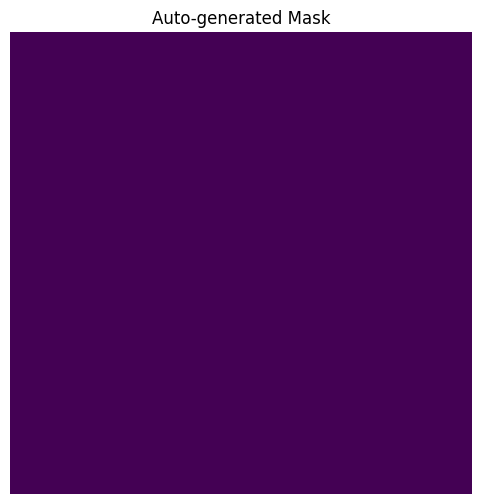

In [13]:
auto_mask = auto_mask_with_segmentation(result_inpaint)
if auto_mask:
    display_image(auto_mask, title="Auto-generated Mask")
else:
    print("Auto masking not available, using manual mask beside astronaut instead.")
    w2, h2 = result_inpaint.size
    auto_mask = create_manual_mask(result_inpaint, (int(w2 * 0.52), int(h2 * 0.35), int(w2 * 0.92), int(h2 * 0.75)))


### Outpainting - Memperluas Kanvas


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

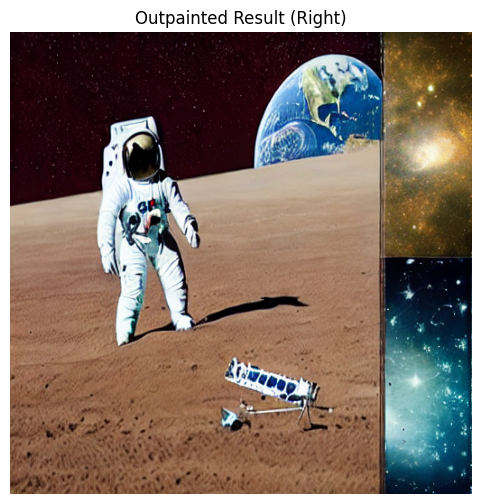

In [14]:
outpaint_result = do_outpainting(image=result_inpaint, prompt="space with stars and nebula background, cinematic lighting", direction="right", expand_pixels=128, seed=9, guidance_scale=7.5, num_inference_steps=50)
display_image(outpaint_result, title="Outpainted Result (Right)")


---
# Kriteria 2: Advanced - Zoom Out & Two-Stage Generation


### Zoom Out - Perluasan Multi-Arah


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

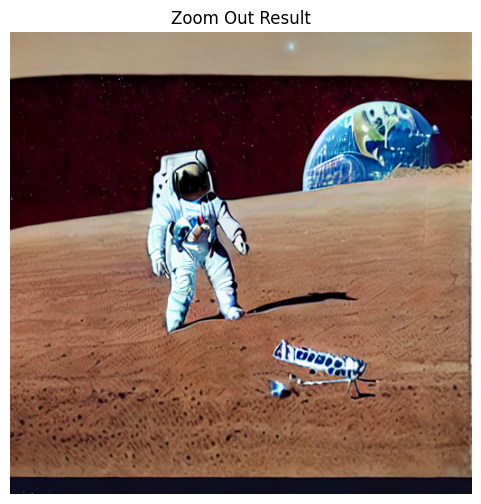

In [15]:
zoom_result = zoom_out(image=result_inpaint, prompt="space with stars and galaxies, cosmic background", expand_pixels=64, steps=1, seed=9, guidance_scale=7.5, num_inference_steps=40)
display_image(zoom_result, title="Zoom Out Result")


### Two-Stage Generation (Base + Refiner)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

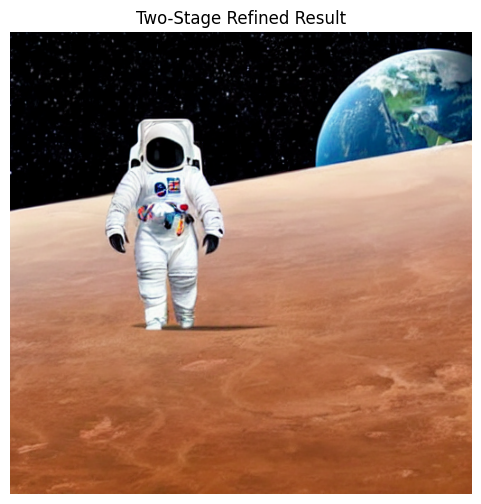

In [17]:
refined_image = two_stage_generate(prompt=prompt, negative_prompt=negative_prompt, seed=222, guidance_scale=7.5, num_inference_steps=100)
display_image(refined_image, title="Two-Stage Refined Result")


---
# Kriteria 3: Streamlit Interface


### Aplikasi Streamlit
File `streamlit_app.py` telah disediakan terpisah. Jalankan dengan perintah:

```bash
streamlit run streamlit_app.py
```

Interface mencakup:
- **Tab 1: Text-to-Image** - Prompt input, slider hyperparameter, batch generation, scheduler selection, Clear Memory
- **Tab 2: Inpainting/Outpainting** - Image upload, Drawable Canvas untuk masking, inpainting & zoom-out

Silakan lihat file `streamlit_app.py` untuk detail implementasi lengkap.


In [18]:
print("Streamlit app code disimpan di file terpisah: streamlit_app.py")
print("Jalankan dengan: streamlit run streamlit_app.py")


Streamlit app code disimpan di file terpisah: streamlit_app.py
Jalankan dengan: streamlit run streamlit_app.py


---
## Cleanup


In [19]:
clear_memory()
print("Done!")


Memory cleared.
Done!
